## Train, evaluate ssd on uadetrac and see how it performs in terms of precision and recall (unlabeled boxes)

In [1]:
## first let's load the data and corresponding boxes / labels for training

%pylab inline
%load_ext autoreload
%autoreload 2

import os
import sys
sys.argv=['']
sys.path.append('../../')


import numpy as np
import utils.helpers as helpers
import eva_storage.evaluation.evaluate_ssd as evaluate_ssd
from loaders.uadetrac_loader import UADetracLoader


Populating the interactive namespace from numpy and matplotlib


In [2]:
# load the data  
loader = UADetracLoader()
images = loader.load_cached_images()
labels = loader.load_cached_labels()
boxes = loader.load_boxes()
video_start_indices = loader.get_video_start_indices()

['.ipynb_checkpoints', 'MVI_20011.xml', 'MVI_20012.xml', 'MVI_20032.xml', 'MVI_20033.xml', 'MVI_20034.xml', 'MVI_20035.xml', 'MVI_20051.xml', 'MVI_20052.xml', 'MVI_20061.xml', 'MVI_20062.xml', 'MVI_20063.xml', 'MVI_20064.xml', 'MVI_20065.xml']
skipping .ipynb_checkpoints
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20011.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20012.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20032.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20033.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20034.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20035.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20051.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20052.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20061.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20062.xml
/home/jbang36/eva/data/ua_detrac/small-annotations/MVI_20063.xml
/home/jbang36

In [3]:
print(images.shape)

(10421, 300, 300, 3)


In [4]:
print(video_start_indices)

[ 664  936  437  784  800  800  906  694  800  800  800  800 1200]


In [4]:
## Starting modification of train_ssd.py for ua-detrac
## importing all relevant files
import argparse
import os
import logging
import sys
import itertools
import torch
import config as jaeho_config
from torch.utils.data import DataLoader, ConcatDataset
from torch.optim.lr_scheduler import CosineAnnealingLR, MultiStepLR


from eva_storage.external.ssd.vision.utils.misc import str2bool, Timer, freeze_net_layers, store_labels
from eva_storage.external.ssd.vision.ssd.ssd import MatchPrior
from eva_storage.external.ssd.vision.ssd.vgg_ssd import create_vgg_ssd
#from eva_storage.external.ssd.vision.ssd.mobilenetv1_ssd import create_mobilenetv1_ssd
#from eva_storage.external.ssd.vision.ssd.mobilenetv1_ssd_lite import create_mobilenetv1_ssd_lite
#from eva_storage.external.ssd.vision.ssd.mobilenet_v2_ssd_lite import create_mobilenetv2_ssd_lite
#from eva_storage.external.ssd.vision.ssd.squeezenet_ssd_lite import create_squeezenet_ssd_lite
#from eva_storage.external.ssd.vision.datasets.voc_dataset import VOCDataset
#from eva_storage.external.ssd.vision.datasets.open_images import OpenImagesDataset
from eva_storage.external.ssd.vision.nn.multibox_loss import MultiboxLoss
from eva_storage.external.ssd.vision.ssd.config import vgg_ssd_config
from eva_storage.external.ssd.vision.ssd.config import mobilenetv1_ssd_config
from eva_storage.external.ssd.vision.ssd.config import squeezenet_ssd_config
from eva_storage.external.ssd.vision.ssd.data_preprocessing import TrainAugmentation, TestTransform



DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")


if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True
    logging.info("Use Cuda.")



In [17]:
#dataset_path = "/home/jbang36/data/VOCdevkit/VOC2007"
#validation_path = "/home/jbang36/data/VOCdevkit/VOC2007"
base_net = os.path.join("/nethome/jbang36/eva/eva_storage/external/ssd", "models/vgg16_reducedfc.pth")
batch_size = 24
num_workers = 4
num_epochs = 100
checkpoint_folder = 'models/'
lr = 1e-3
momentum = 0.9
weight_decay =5e-4
validation_epochs = 5
debug_steps = 100

timer = Timer()

In [6]:
create_net = create_vgg_ssd
config = vgg_ssd_config

train_transform = TrainAugmentation(config.image_size, config.image_mean,  
                                    config.image_std)
target_transform = MatchPrior(config.priors, config.center_variance,
                                  config.size_variance, 0.5)

test_transform = TestTransform(config.image_size, config.image_mean, 
                               config.image_std)

    

In [7]:
os.getcwd()

'/home/jbang36/eva/eva_storage/evaluation'

In [9]:
## Load the model

num_classes = 5 # should this be 4 or 5?
net = create_net(num_classes)
min_loss = -10000.0
last_epoch = -1
base_net_lr = lr
extra_layers_lr = lr


print("Base net is frozen..")
freeze_net_layers(net.base_net)
params = itertools.chain(net.source_layer_add_ons.parameters(), net.extras.parameters(),
                         net.regression_headers.parameters(), net.classification_headers.parameters())
params = [
    {'params': itertools.chain(
        net.source_layer_add_ons.parameters(),
        net.extras.parameters()
    ), 'lr': extra_layers_lr},
    {'params': itertools.chain(
        net.regression_headers.parameters(),
        net.classification_headers.parameters()
    )}
]

"""
## original set of networks
net.init_from_base_net(base_net)
## loading from pretrained model!!
#pretrained_ssd_dir = '/nethome/jbang36/eva/eva_storage/external/ssd/models/vgg16-ssd-Epoch-149-Loss-3.3744568502269505.pth'
#net.init_from_pretrained_ssd(pretrained_ssd_dir)


"""
net.init_from_base_net(base_net)
## loading from pretrained model!!
#pretrained_ssd_dir = '/nethome/jbang36/eva/eva_storage/external/ssd/models/overnight/vgg16-ssd:epoch1000'
#net.init_from_pretrained_ssd(pretrained_ssd_dir)


net.to(DEVICE)

print("Done loading to GPU")


Base net is frozen..
Done loading to GPU


In [10]:
## Load the rest (optimizer, loss function, etc)

criterion = MultiboxLoss(config.priors, iou_threshold=0.5, neg_pos_ratio=3,
                         center_variance=0.1, size_variance=0.2, device=DEVICE)
optimizer = torch.optim.SGD(params, lr=lr, momentum=0.9,
                            weight_decay=5e-4)


milestones = [int(v.strip()) for v in "80,100".split(",")]
scheduler = MultiStepLR(optimizer, milestones=milestones,
                        gamma=0.1, last_epoch=last_epoch)

In [11]:
division_point = int(images.shape[0] * 0.8)
X_train = images[:division_point]
X_test = images[division_point:]
y_train = labels['vehicle'][:division_point]
y_test = labels['vehicle'][division_point:]
y_train_boxes = boxes[:division_point]
y_test_boxes = boxes[division_point:]


In [12]:
## We need to make val dataset...

val_division = int(0.8 * len(X_train))
X_val = X_train[val_division:]
X_train = X_train[:val_division]
y_val_boxes = y_train_boxes[val_division:]
y_train_boxes = y_train_boxes[:val_division]
y_val = y_train[val_division:]
y_train = y_train[:val_division]

In [13]:
train_dataset = evaluate_ssd.UADataset_lite(transform=train_transform, target_transform=target_transform)

train_dataset.set_x(X_train)
train_dataset.set_y(y_train)
train_dataset.set_y_boxes(y_train_boxes)


0


In [14]:
val_dataset = evaluate_ssd.UADataset_lite(transform=train_transform, target_transform=target_transform)
val_dataset.set_x(X_val)
val_dataset.set_y(y_val)
val_dataset.set_y_boxes(y_val_boxes)

test_dataset = evaluate_ssd.UADataset_lite(transform=train_transform, target_transform=target_transform)
test_dataset.set_x(X_test)
test_dataset.set_y(y_test)
test_dataset.set_y_boxes(y_test_boxes)

0
0


In [15]:
## convert to loader 
batch_size = 24
train_loader = DataLoader(train_dataset, batch_size,
                          num_workers= 4,
                          shuffle=True)

val_loader = DataLoader(val_dataset, batch_size,
                          num_workers= 4,
                          shuffle=True)

In [16]:
## defining train / test functions

def train(loader, net, criterion, optimizer, device, debug_steps=100, epoch=-1):
    net.train(True)
    running_loss = 0.0
    running_regression_loss = 0.0
    running_classification_loss = 0.0
    for i, data in enumerate(loader):
        images, gt_locations, labels = data
        images = images.to(device)
        gt_locations = gt_locations.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        confidence, locations = net(images)
        ## need to make sure criterion takes in locations
        regression_loss, classification_loss = criterion(confidence, locations, labels, gt_locations)
        loss = regression_loss + classification_loss
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        running_regression_loss += regression_loss.item()
        running_classification_loss += classification_loss.item()
        if i and i % debug_steps == 0:
            avg_loss = running_loss / debug_steps
            avg_reg_loss = running_regression_loss / debug_steps
            avg_clf_loss = running_classification_loss / debug_steps
            logging.info(
                f"Epoch: {epoch}, Step: {i}, " +
                f"Average Loss: {avg_loss:.4f}, " +
                f"Average Regression Loss {avg_reg_loss:.4f}, " +
                f"Average Classification Loss: {avg_clf_loss:.4f}"
            )
            running_loss = 0.0
            running_regression_loss = 0.0
            running_classification_loss = 0.0


def test(loader, net, criterion, device):
    net.eval()
    running_loss = 0.0
    running_regression_loss = 0.0
    running_classification_loss = 0.0
    num = 0
    for _, data in enumerate(loader):
        images, boxes, labels = data
        images = images.to(device)
        boxes = boxes.to(device)
        labels = labels.to(device)
        num += 1

        with torch.no_grad():
            confidence, locations = net(images)
            regression_loss, classification_loss = criterion(confidence, locations, labels, boxes)
            loss = regression_loss + classification_loss

        running_loss += loss.item()
        running_regression_loss += regression_loss.item()
        running_classification_loss += classification_loss.item()
    return running_loss / num, running_regression_loss / num, running_classification_loss / num


In [18]:
checkpoint_folder = '/nethome/jbang36/eva/eva_storage/external/ssd/models/uadetrac'

In [19]:
## train the model
## let's just import utils and do all evaluations here?
import time

st = time.time()

for epoch in range(last_epoch + 1, num_epochs):
    scheduler.step()
    train(train_loader, net, criterion, optimizer,
          device=DEVICE, debug_steps=debug_steps, epoch=epoch)

    if epoch % validation_epochs == 0 or epoch == num_epochs - 1:
        net.eval()
        running_loss = 0.0
        running_regression_loss = 0.0
        running_classification_loss = 0.0
        num = 0
        for _, data in enumerate(val_loader):
            images, boxes, labels = data
            images = images.to(DEVICE)
            boxes = boxes.to(DEVICE)
            labels = labels.to(DEVICE)
            num += 1
            with torch.no_grad():
                confidence, locations = net(images)
                regression_loss, classification_loss = criterion(confidence, locations, labels, boxes)
                loss = regression_loss + classification_loss
            running_loss += loss.item()
            running_regression_loss += regression_loss.item()
            running_classification_loss += classification_loss.item()
        val_loss = running_loss / num
        val_regression_loss = running_regression_loss / num
        val_classification_loss = running_regression_loss / num
        print("epoch", epoch)
        print("  Validation Loss: {v:.4f}".format(v=val_loss))
        print("  Validation Regression Loss: {v:.4f}".format(v=val_regression_loss))
        print("  Validation Classification Loss: {v:.4f}".format(v=val_classification_loss))
        
        checkpoint_file_name = f"vgg16-ssd_epoch-{epoch}_loss-{val_loss}"
        model_path = os.path.join(checkpoint_folder, checkpoint_file_name)
        net.save(model_path)
        
print("Total time to train...", time.time() - st, "seconds")


/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/site-packages/torch/nn/_reduction.py:46: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch 0
  Validation Loss: 5.6411
  Validation Regression Loss: 2.3785
  Validation Classification Loss: 2.3785
epoch 5
  Validation Loss: 4.7153
  Validation Regression Loss: 1.9150
  Validation Classification Loss: 1.9150
epoch 10
  Validation Loss: 4.4968
  Validation Regression Loss: 1.8139
  Validation Classification Loss: 1.8139
epoch 15
  Validation Loss: 4.4563
  Validation Regression Loss: 1.7504
  Validation Classification Loss: 1.7504
epoch 20
  Validation Loss: 4.3262
  Validation Regression Loss: 1.7043
  Validation Classification Loss: 1.7043
epoch 25
  Validation Loss: 4.3035
  Validation Regression Loss: 1.6673
  Validation Classification Loss: 1.6673
epoch 30
  Validation Loss: 4.2046
  Validation Regression Loss: 1.6167
  Validation Classification Loss: 1.6167
epoch 35
  Validation Loss: 4.1880
  Validation Regression Loss: 1.5948
  Validation Classification Loss: 1.5948
epoch 40
  Validation Loss: 4.1534
  Validation Regression Loss: 1.5747
  Validation Classificatio

## Evaluation

In [25]:
test_loader = DataLoader(test_dataset, batch_size,
                          num_workers= 4,
                          shuffle=False)

## need to modify DEVICE to cuda:0 because the code is written that way....
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [26]:
##### Big mistake I made is that for testing we need to reload the network
## looking at the images, I don't think this is a good measure 
## because it creates multiple boxes for each object...
## so we need to figure out a way to eliminate recurring boxes
# let's try evaluation method that is already implemented from eval_ssd.py

import eva_storage.external.ssd.eval_ssd as eval_ssd
from eva_storage.external.ssd.vision.ssd.vgg_ssd import create_vgg_ssd, create_vgg_ssd_predictor

## TODO - trained_model needs to be the saved model!!!!!!

timer = Timer()
class_names = ['BACKGROUND', 'car', 'bus', 'others', 'van']
#trained_model = '/nethome/jbang36/eva/eva_storage/external/ssd/models/voc/ssd_voc-Epoch-140-Loss-4.849786701202393.pth'
trained_model = '/nethome/jbang36/eva/eva_storage/external/ssd/models/uadetrac/vgg16-ssd_epoch-95_loss-3.8357981954302107'

net = create_vgg_ssd(len(class_names), is_test=True)
net.load(trained_model)
net = net.to(DEVICE)

In [27]:



#true_case_stat, all_gb_boxes, all_difficult_cases = eval_ssd.group_annotation_by_class(test_loader)
true_case_stat, all_gb_boxes, all_difficult_cases = eval_ssd.group_annotation_by_class(test_dataset)
    
predictor = create_vgg_ssd_predictor(net, nms_method="hard", device=DEVICE)
results = []

dataset = test_dataset


In [23]:
## all_gb_boxes.keys() == [1,2,3,4]
## for each all_gb_box[key] it is dict{frame_id: box_coordinates}


(all_gb_boxes.keys())
all_gb_boxes[1][1]

tensor([[213.,   0., 220.,  11.],
        [199.,   6., 205.,  17.],
        [203.,   0., 208.,  13.],
        [209.,  10., 217.,  24.],
        [222.,  18., 232.,  34.],
        [218.,  22., 230.,  40.],
        [166.,  15., 174.,  28.],
        [179.,   6., 185.,  18.],
        [263.,  30., 290.,  51.],
        [263.,  63., 287., 100.]])

In [28]:
for i in range(len(dataset)):
    print("process image", i)
    timer.start("Load Image")
    image = dataset.get_image(i)
    print("Load Image: {:4f} seconds.".format(timer.end("Load Image")))
    timer.start("Predict")
    boxes, labels, probs = predictor.predict(image)
    print("Prediction: {:4f} seconds.".format(timer.end("Predict")))
    indexes = torch.ones(labels.size(0), 1, dtype=torch.float32) * i
    results.append(torch.cat([
        indexes.reshape(-1, 1),
        labels.reshape(-1, 1).float(),
        probs.reshape(-1, 1),
        boxes   # + 1.0 matlab's indexes start from 1
    ], dim=1))
    
    
results = torch.cat(results)

process image 0
Load Image: 0.000029 seconds.
Inference time:  0.2417891025543213
Prediction: 0.331668 seconds.
process image 1
Load Image: 0.000013 seconds.
Inference time:  0.005592823028564453
Prediction: 0.096367 seconds.
process image 2
Load Image: 0.000006 seconds.
Inference time:  0.005606174468994141
Prediction: 0.092049 seconds.
process image 3
Load Image: 0.000006 seconds.
Inference time:  0.0055921077728271484
Prediction: 0.092721 seconds.
process image 4
Load Image: 0.000006 seconds.
Inference time:  0.005576372146606445
Prediction: 0.092102 seconds.
process image 5
Load Image: 0.000006 seconds.
Inference time:  0.00559234619140625
Prediction: 0.093330 seconds.
process image 6
Load Image: 0.000006 seconds.
Inference time:  0.00558018684387207
Prediction: 0.088073 seconds.
process image 7
Load Image: 0.000005 seconds.
Inference time:  0.0045702457427978516
Prediction: 0.073192 seconds.
process image 8
Load Image: 0.000004 seconds.
Inference time:  0.004341840744018555
Predic

In [29]:
prediction_results = results

In [30]:
## it would be best to save the results....
# result would be a list of tensors...how are we going to save this?
print(results.size(0))
print(results[10000]) ##index, label, probs, boxes - so there should be 7
print(results[100000:110000])

2026577
tensor([  10.0000,    1.0000,    2.1763, -201.0100,   17.0225,   35.8360,
         -48.6696])
tensor([[ 102.0000,    4.0000,    1.8368,  ...,  452.3837,  267.5796,
          276.0197],
        [ 102.0000,    4.0000,    1.8356,  ..., -237.5963, -404.1473,
         -149.7341],
        [ 102.0000,    4.0000,    1.8343,  ...,  -83.9574, -157.7726,
          272.7111],
        ...,
        [ 113.0000,    0.0000,    1.5800,  ..., -410.6375,  -90.0592,
         -119.0215],
        [ 113.0000,    0.0000,    1.5743,  ..., -136.0241, -280.5690,
         -124.4400],
        [ 113.0000,    0.0000,    1.5743,  ...,   -8.8527, -283.4821,
          -58.3186]])


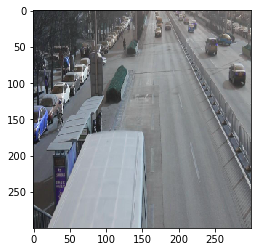

In [68]:
img = X_test[40]
plt.imshow(img)

In [70]:

for i in range(40,60):

    image_id, annotation = test_dataset.get_annotation(i)
    gt_boxes, classes, is_diffcult = annotation
    print(gt_boxes)
    print(classes)
    break
    
    

[[219.   0. 226.  11.]
 [200.   5. 206.  15.]
 [204.   0. 209.  11.]
 [207.   8. 214.  21.]
 [217.  13. 225.  26.]
 [212.  17. 221.  32.]
 [166.  23. 176.  38.]
 [181.  16. 189.  29.]
 [168.  11. 178.  29.]
 [252.  30. 274.  50.]
 [236.  38. 253.  63.]
 [269.  73. 292. 104.]
 [ 15. 168. 155. 300.]]
[1 1 1 1 1 1 1 1 3 1 1 1 2]


In [30]:
true_case_stat, all_gb_boxes, all_difficult_cases = eval_ssd.group_annotation_by_class(dataset)

In [45]:
a = all_gb_boxes[1][2084]
print(a.size())
for t in a:
    print(t)

torch.Size([3, 4])
tensor([132.,  43., 149.,  68.])
tensor([144.,  52., 161.,  79.])
tensor([171.,   6., 180.,  20.])


In [33]:
class_names = ['BACKGROUND', 'car', 'bus', 'others', 'van']
eval_path = '/nethome/jbang36/eva/eva_storage/evaluation'

for class_index, class_name in enumerate(class_names):
    if class_index == 0: continue  # ignore background
    prediction_path = os.path.join(eval_path,f"det_test_{class_name}.txt")
    with open(prediction_path, "w") as f:
        sub = results[results[:, 1] == class_index, :]
        for i in range(sub.size(0)):
            prob_box = sub[i, 2:].numpy()
            image_id = int(sub[i,0])
            print(
                str(image_id) + " " + " ".join([str(v) for v in prob_box]),
                file=f
            )



In [53]:
print(true_case_stat[2].keys())
#print(all_gb_boxes)
print(iou_threshold)

AttributeError: 'int' object has no attribute 'keys'

In [ ]:
######### 

In [57]:
frame_ids = all_gb_boxes[2].keys()
print(frame_ids)

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 

In [80]:
aps = []
    
iou_threshold = 0.3
use_2007_metric = False
print("\n\nAverage Precision Per-class:")

##TODO: compute_average_precision_per_class is not working well; its either that or prediction path is incorrect


for class_index, class_name in enumerate(class_names):
    if class_index == 0: continue #background
    print(class_index, class_name)
    prediction_path = os.path.join(eval_path, f"det_test_{class_name}.txt")
    print(prediction_path)
    ap = eval_ssd.compute_average_precision_per_class(
        true_case_stat[class_index],
        all_gb_boxes[class_index],
        all_difficult_cases[class_index],
        prediction_path,
        iou_threshold, 
        use_2007_metric
    )
    aps.append(ap)
    print(f"done with {class_name}")
    
print("------------")
print(aps)
print(sum(aps))
print(len(aps))
print("------------")

    
print(f"\nAverage Precision Across All Classes:{sum(aps)/len(aps)}")



Average Precision Per-class:
1 car
/nethome/jbang36/eva/eva_storage/evaluation/det_test_car.txt
converting image ids to int instead of str
Printing stats for class...
true_positive [1.0000e+00 2.0000e+00 3.0000e+00 ... 2.5109e+04 2.5109e+04 2.5109e+04]
false_positive [     0.      0.      0. ... 141836. 141837. 141838.]
precision is [1.         1.         1.         ... 0.15040283 0.15040193 0.15040103]
recall is [3.48918353e-05 6.97836706e-05 1.04675506e-04 ... 8.76099093e-01
 8.76099093e-01 8.76099093e-01]
done with car
2 bus
/nethome/jbang36/eva/eva_storage/evaluation/det_test_bus.txt
converting image ids to int instead of str
image_id 68 not in gt_boxes!!!! skipping....
image_id 69 not in gt_boxes!!!! skipping....
image_id 473 not in gt_boxes!!!! skipping....
image_id 70 not in gt_boxes!!!! skipping....
image_id 409 not in gt_boxes!!!! skipping....
image_id 472 not in gt_boxes!!!! skipping....
image_id 477 not in gt_boxes!!!! skipping....
image_id 479 not in gt_boxes!!!! skipping

In [84]:
#### weight the accuracy by number of examples within each class - 0.54



aps = []
    
iou_threshold = 0.3
use_2007_metric = False
print("\n\nAverage Precision Per-class:")

##TODO: compute_average_precision_per_class is not working well; its either that or prediction path is incorrect

samples_list = []

for class_index, class_name in enumerate(class_names):
    if class_index == 0: continue #background
    print(class_index, class_name)
    prediction_path = os.path.join(eval_path, f"det_test_{class_name}.txt")
    print(prediction_path)
    n_boxes, ap = eval_ssd.compute_average_precision_per_class_weighed(
        true_case_stat[class_index],
        all_gb_boxes[class_index],
        all_difficult_cases[class_index],
        prediction_path,
        iou_threshold, 
        use_2007_metric
    )
    aps.append(ap)
    samples_list.append(n_boxes)
    print(f"done with {class_name}")
    
print("------------")
print(aps)
print(sum(aps))
print(len(aps))
print("------------")


final_precision = 0
for i, a in enumerate(aps):
    final_precision += a * samples_list[i] / sum(samples_list)

    
print(f"\nAverage Precision Across All Classes:{sum(aps)/len(aps)}")
print(f"\nAverage Precision Across All Classes weighed by number of samples: {final_precision}")



Average Precision Per-class:
1 car
/nethome/jbang36/eva/eva_storage/evaluation/det_test_car.txt
converting image ids to int instead of str
Printing stats for class...
true_positive [1.0000e+00 2.0000e+00 3.0000e+00 ... 2.5109e+04 2.5109e+04 2.5109e+04]
false_positive [     0.      0.      0. ... 141836. 141837. 141838.]
precision is [1.         1.         1.         ... 0.15040283 0.15040193 0.15040103]
recall is [3.48918353e-05 6.97836706e-05 1.04675506e-04 ... 8.76099093e-01
 8.76099093e-01 8.76099093e-01]
done with car
2 bus
/nethome/jbang36/eva/eva_storage/evaluation/det_test_bus.txt
converting image ids to int instead of str
image_id 68 not in gt_boxes!!!! skipping....
image_id 69 not in gt_boxes!!!! skipping....
image_id 473 not in gt_boxes!!!! skipping....
image_id 70 not in gt_boxes!!!! skipping....
image_id 409 not in gt_boxes!!!! skipping....
image_id 472 not in gt_boxes!!!! skipping....
image_id 477 not in gt_boxes!!!! skipping....
image_id 479 not in gt_boxes!!!! skipping

In [85]:
samples_list

[166947, 130729, 36337, 149283]

In [97]:
a = np.array([1, 2])
b = np.array([5, 6])
np.concatenate((a, b), axis=0)

array([1, 2, 5, 6])

In [96]:
## class agnostic approach!!!

ap = eval_ssd.compute_average_precision_class_agnostic(true_case_stat, all_gb_boxes, all_difficult_cases, class_names, iou_threshold, use_2007_metric)
print(f"average precision for agonostic approach {ap}")

1 car
converting image ids to int instead of str
Printing stats for class...
true_positive [1. 1. 1. ... 0. 0. 0.]
false_positive [0. 0. 0. ... 1. 1. 1.]
precision is [1.         1.         1.         ... 0.15040283 0.15040193 0.15040103]
recall is [3.08090455e-05 6.16180911e-05 9.24271366e-05 ... 7.73584324e-01
 7.73584324e-01 7.73584324e-01]
average precision for agonostic approach 0.5507456025486182


In [73]:
aps_copy = aps
aps_copy.pop(2)
print(aps_copy)
print(aps)
sum(aps) / len(aps)

[0.6081814721203481, 0.8226137591547152]
[0.6081814721203481, 0.8226137591547152]


0.7153976156375317